# Overview
This is a notebook that uses DALL-E's decoder and CLIP to generate images from text. The foundation for this notebook is from https://colab.research.google.com/drive/1Q-TbYvASMPRMXCOQjkxxf72CXYjR_8Vp?usp=sharing

Messing with the parameters and inputing the same text was very interesting to me. Initially, the pictures had a ton of white space in them (pinkdog.png) but a simple addition of a parameter largely eliminated that. Another thing to note is that I was intrigued that many of the pictures had a element of "cloudiness". Perhaps this is because I did not train long enough but I was surprised how consistent the cloudiness of the pictures were. I dont even necessarily mean blurry, but rather some part would have a visual representation that was cloud like.

I spent a lot of time tuning the hyper parameters and figuring out if I could add more to certain functions to improve the quality of the images outputted. In the places I noticed the most significant differences, I displayed pictures generated from the same text input but with different relevant parameters to show the difference the parameters made.




# Image to Create
You can play around and enter text to create an image if you want. I have submitted a bunch of my own images that were made.

In [1]:

text_input = "empathy" 



# Install/Import Dependencies
CUDA is a parallel computing platform that allow the use of a CUDA-enabled GPU for general purpose processing

In [2]:
import subprocess

CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

!pip install torch==1.7.1{torch_version_suffix} torchvision==0.8.2{torch_version_suffix} -f https://download.pytorch.org/whl/torch_stable.html ftfy regex

CUDA version: 11.0
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1MB 1.4MB/s eta 0:03:57tcmalloc: large alloc 1147494400 bytes == 0x55dbe9f54000 @  0x7f33c6992615 0x55dbb0df506c 0x55dbb0ed4eba 0x55dbb0df7e8d 0x55dbb0ee999d 0x55dbb0e6bfe9 0x55dbb0e66b0e 0x55dbb0df977a 0x55dbb0e6be50 0x55dbb0e66b0e 0x55dbb0df977a 0x55dbb0e6886a 0x55dbb0eea7c6 0x55dbb0e67ee2 0x55dbb0eea7c6 0x55dbb0e67ee2 0x55dbb0eea7c6 0x55dbb0e67ee2 0x55dbb0eea7c6 0x55dbb0f6c431 0x55dbb0ecd049 0x55dbb0e37c84 0x55dbb0df88e9 0x55dbb0e6cade 0x55dbb0df969a 0x55dbb0e67a45 0x55dbb0e66e0d 0x55dbb0df977a 0x55dbb0e67a45 0x55dbb0df969a 0x55dbb0e67a45
     |█████████████████████████████▏  | 1055.7MB 2.2MB/s eta 0:00:46tcmalloc: large alloc 1434370048 bytes == 0x55dc2e5aa000 @  0x7f33c6992615 0x55dbb0df506c 0x55dbb0ed4eba 0x55dbb0df7e8d 0x55dbb0ee999d 0x55dbb0e6bfe9 0x55dbb0e66b0e 0x55dbb0df977a 0x55dbb0e6be50 0x55dbb0e66b0e 0x55dbb0df977a 0x55dbb0e6886a 0x55dbb0eea7

In [3]:
import numpy as np
import torchvision
import torchvision.transforms.functional as TF

# import PIL
# import matplotlib.pyplot as plt

import os
import random
import imageio
from IPython import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab import output

!nvidia-smi -L

GPU 0: Tesla K80 (UUID: GPU-b4115645-3004-b614-f7f6-422c229167a9)


# Importing from CLIP

CLIP (Contrastive Language–Image Pre-training) was created to address the common problems in deep learning such as "typical vision datasets are labor intensive and costly to create while teaching only a narrow set of visual concepts; standard vision models are good at one task and one task only, and require significant effort to adapt to a new task; and models that perform well on benchmarks have disappointingly poor performance on stress tests" (https://openai.com/blog/clip/)

This notebook will be using the perceptor and preprocessor from CLIP

In [4]:
%cd /content/

!git clone https://github.com/openai/CLIP.git

%cd /content/CLIP/

!pip install ftfy

import os
import clip
import torch

clip.available_models()

# Load from CLIP
perceptor, preprocess = clip.load('ViT-B/32', jit=True)
perceptor = perceptor.eval()

/content
Cloning into 'CLIP'...
remote: Enumerating objects: 86, done.
remote: Total 86 (delta 0), reused 0 (delta 0), pack-reused 86
Unpacking objects: 100% (86/86), done.
/content/CLIP


['RN50', 'RN101', 'RN50x4', 'ViT-B/32']

100%|███████████████████████████████████████| 354M/354M [00:04<00:00, 71.2MiB/s]


In [5]:
# Params for later
im_shape = [512, 512, 3]
sideX, sideY, channels = im_shape


# Define

In [6]:
# #scale and display
def displ(img, pre_scaled=True):
  img = np.array(img)[:,:,:]
  img = np.transpose(img, (1, 2, 0))
  if not pre_scaled:
    img = scale(img, 48*4, 32*4)
  imageio.imwrite(str(3) + '.png', np.array(img))
  return display.Image(str(3)+'.png')

  

# Generator
Will be using the decoder from DALL-E which is a transformer language model like GBT-3. It gets text and the image as a single stream of data, and is trained using maximum likelihood to generate all of the tokens consecutively.

"This training procedure allows DALL-E to not only generate an image from scratch, but also to regenerate any rectangular region of an existing image that extends to the bottom-right corner, in a way that is consistent with the text prompt."

https://openai.com/blog/dall-e/


In [7]:
import io
import os, sys

import torchvision.transforms as T
import torchvision.transforms.functional as TF

!pip install git+https://github.com/openai/DALL-E.git

from dall_e import map_pixels, unmap_pixels, load_model

model = load_model("https://cdn.openai.com/dall-e/decoder.pkl", 'cuda')


  Cloning https://github.com/openai/DALL-E.git to /tmp/pip-req-build-gohv6v3k
  Running command git clone -q https://github.com/openai/DALL-E.git /tmp/pip-req-build-gohv6v3k
     |████████████████████████████████| 61kB 2.8MB/s 
     |████████████████████████████████| 21.6MB 2.0MB/s 
     |████████████████████████████████| 153kB 41.1MB/s 
     |████████████████████████████████| 1.9MB 37.8MB/s 
     |████████████████████████████████| 747kB 29.6MB/s 
  Created wheel for DALL-E: filename=DALL_E-0.1-cp37-none-any.whl size=6000 sha256=62a7dcb44d883326839db6949cf46ac5270dc3ffa4c84fb48f5878a650d74511
  Stored in directory: /tmp/pip-ephem-wheel-cache-cdzkb74p/wheels/e9/f5/e7/efa7ddb4c5899f6e6ffbbd112b8c7a030872274a5cba9ccf04
Successfully built DALL-E
ERROR: requests 2.23.0 has requirement urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you'll have urllib3 1.26.4 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Fou

/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.4) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


# Latent coordinate

In [8]:
class Pars(torch.nn.Module):
    def __init__(self):
        super(Pars, self).__init__()
        self.normu = torch.nn.Parameter(torch.randn(1, 8192, 64, 64).cuda())

    def forward(self):
      # normu = torch.nn.functional.gumbel_softmax(self.normu.view(1, 8192, -1), dim=-1).view(1, 8192, 64, 64)
      # The line below is intended to trade off some of the sharpness in the pictures for less white space in the pictures.
      # The parameter "tau" helps control whether the model provides more white space with higher claraity of the picture or the opposite
      # tau is defined as a non-negative temperature scalar
      # This line below leads to less white space but more clarity in the image, will have an example below

      normu = torch.nn.functional.gumbel_softmax(self.normu.view(1, 8192, -1), dim=-1, tau = 1.5).view(1, 8192, 64, 64)

      return normu

Mounted at /content/drive


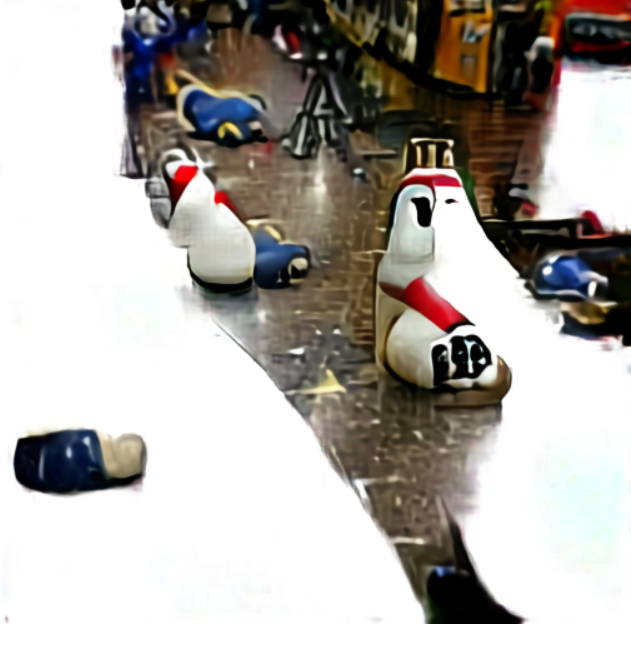

'bowling pins knocked over' 



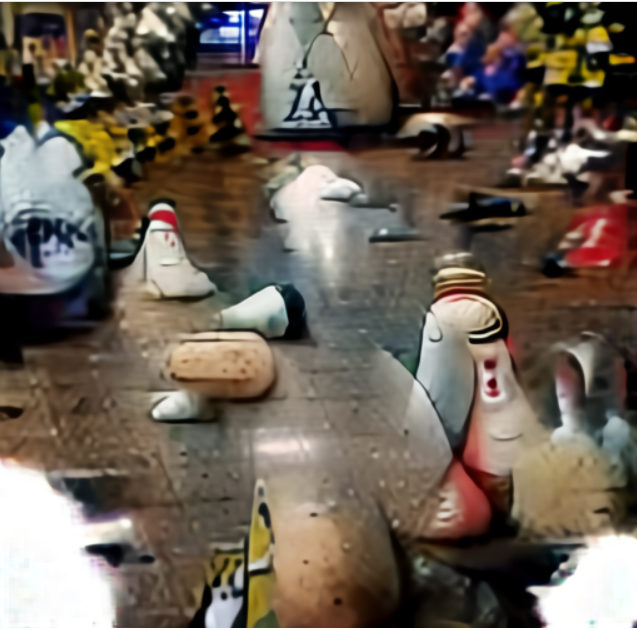

'bowling pins knocked over' with tau: 1.5 



In [9]:
from google.colab import drive
drive.mount('/content/drive')
from IPython.display import Image

PATH = "/content/drive/My Drive/Colab Notebooks/bowlingpinsknockedover.PNG"
Image(filename = PATH , width=300, height=300)
print("'bowling pins knocked over'", "\n")

PATH = "/content/drive/My Drive/Colab Notebooks/bowlingpinsknockedoverlesswhitespace.PNG"
Image(filename = PATH , width=300, height=300)
print("'bowling pins knocked over' with tau: 1.5", "\n")

What a difference a single parameters inclusion can make in the output. The excessive amounts of white space was really annoying me up until the point that I figured out how to get rid of it. From here on out, I left the tau parameter included because it makes for a much more informative picture.

In [10]:
lats = Pars().cuda()
mapper = [lats.normu]
optimizer = torch.optim.Adam([{'params': mapper, 'lr': .1}])

# Tokenize and encode input
tx = clip.tokenize(text_input)
t = perceptor.encode_text(tx.cuda()).detach().clone()


# The trios of numbers inside the two () are the mean and standard deviations for the channels

#These values made a very abstract, overly-cloudy picture. Picture appeared less related and developed
nom = torchvision.transforms.Normalize((0.9, 0.9, 0.9), (0.9, 0.9, 0.9))

#These values provide a more distinct looking picture, less random looking
# nom = torchvision.transforms.Normalize((0.48, 0.45, 0.4), (0.26, 0.26, 0.27))

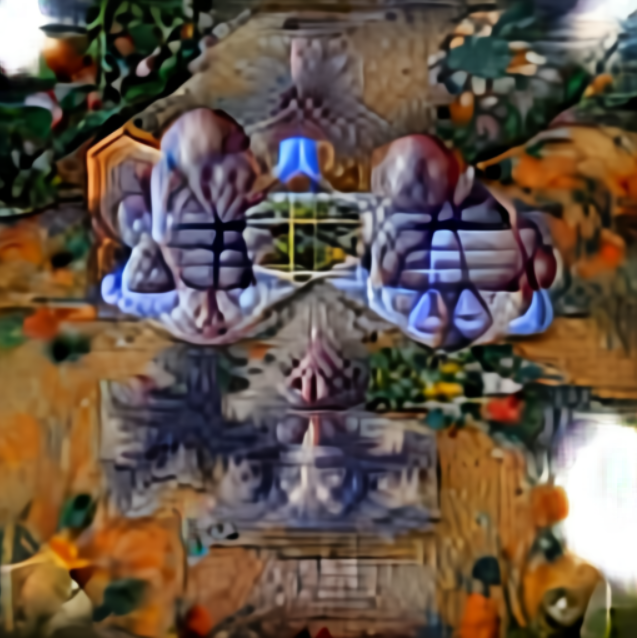

'symmetry' with the smaller Normalize parameters 



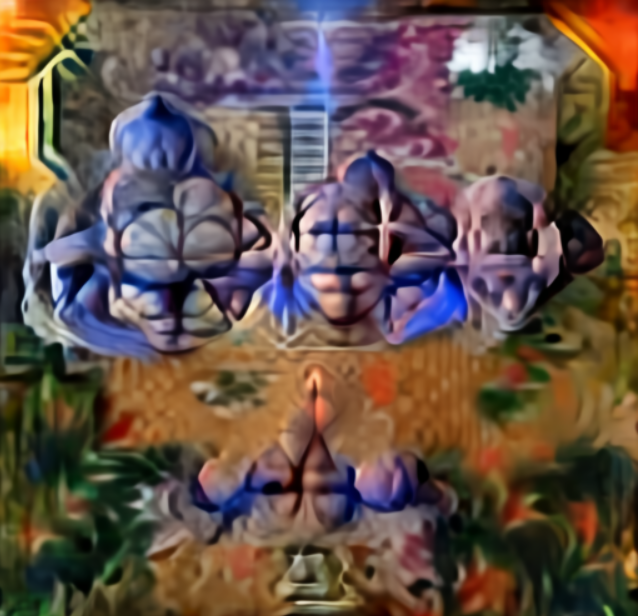

'symmetry' with the larger Normalize parameters 



In [11]:
PATH = "/content/drive/My Drive/Colab Notebooks/symmetry.PNG"
Image(filename = PATH , width=300, height=300)
print("'symmetry' with the smaller Normalize parameters", "\n")

PATH = "/content/drive/My Drive/Colab Notebooks/symmetrymeanstdlarger.PNG"
Image(filename = PATH , width=300, height=300)
print("'symmetry' with the larger Normalize parameters", "\n")

Personally, I think the top image does a better job of portraying "symmetry". It feels more symmetric to me so I have decided increasing the parameters for the Normalize function seems to make the images slightly worse.

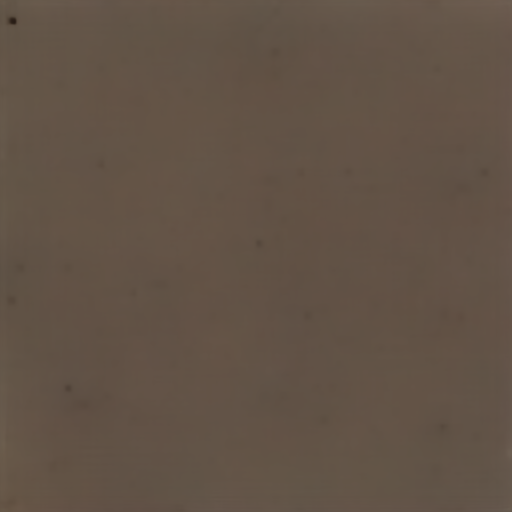

In [12]:





#This will display the "base" picture that the model will build on.
with torch.no_grad():
  al = unmap_pixels(torch.sigmoid(model(lats()).cpu().float())).numpy()
  for allls in al:
    displ(allls[:3])
    print('\n')

The image above will serve as the "base photo" or essentially what all the pictures will start out as.

# Training
The following cell will train the model based on the text input and output the representing picture after each epoch. While running this on different text input I noticed that the outputs tending to converge on the same picture at different amounts of iterations. For that reason, rather than running for a fixed number of epochs, I let it run until I was convinced output had converged to a roughly the same picture, I screenshotted and started over. Obviously, if I had let it run more the picture would continue to change but I didnt have the time to let it run for hours each time.  

In [13]:
def checkin(loss):
  #construct image
  with torch.no_grad():
    al = unmap_pixels(torch.sigmoid(model(lats())[:, :3]).cpu().float()).numpy()
  for allls in al:
    #Print image
    displ(allls)
    display.display(display.Image(str(3)+'.png'))
    print('\n')


def ascend_txt():
  out = unmap_pixels(torch.sigmoid(model(lats())[:, :3].float()))

  #Odd thing I noticed, when setting cutn to 128, more words were displayed in the outputted picture, not exactly sure why
  # cutn = 128
  cutn = 64 
  #When cutn set to 8, it seems like the picture is less cohesive, and more like many different pictures stitched together
  # cutn = 8
  p_s = []
  #generate tensors of image
  for ch in range(cutn):
    size = int(sideX*torch.zeros(1,).normal_(mean=.8, std=.3).clip(.5, .98))
    offsetx = torch.randint(0, sideX - size, ())
    offsety = torch.randint(0, sideX - size, ())
    apper = out[:, :, offsetx:offsetx + size, offsety:offsety + size]
    apper = torch.nn.functional.interpolate(apper, (224,224), mode='bilinear')
    p_s.append(apper)
  #concatenate tensors together
  into = torch.cat(p_s, 0)

  #normalize
  into = nom(into)

  #encode
  iii = perceptor.encode_image(into)

  lat_l = 0
  
  # return the loss
  return [lat_l, 10*-torch.cosine_similarity(t, iii).view(-1, 1).T.mean(1)]

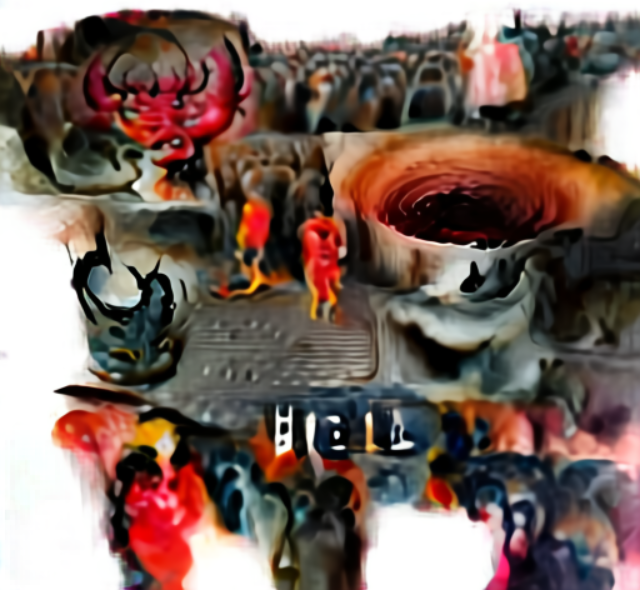

'hell' with cutn: 8 



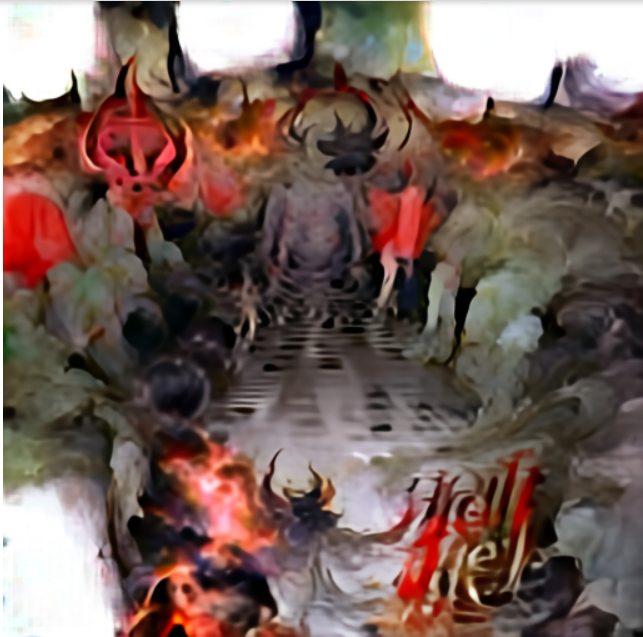

'hell' with cutn: 64 



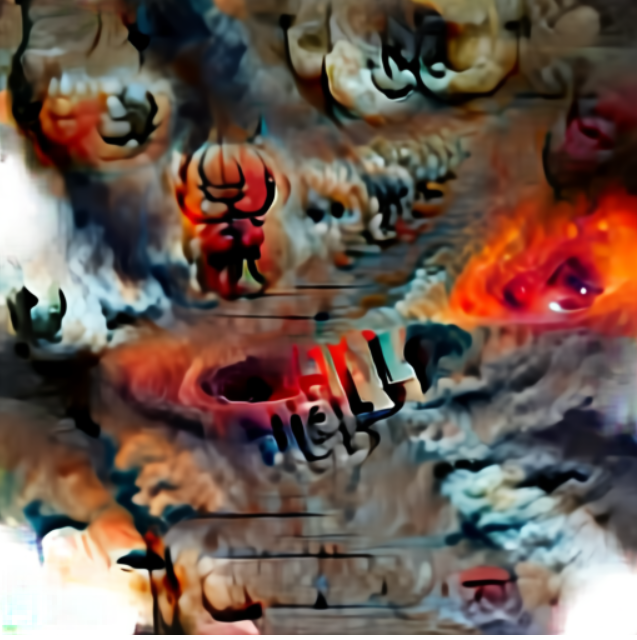

'hell' with cutn: 128 



In [14]:

PATH = "/content/drive/My Drive/Colab Notebooks/hellcutn8.PNG"
Image(filename = PATH , width=300, height=300)
print("'hell' with cutn: 8", "\n")

PATH = "/content/drive/My Drive/Colab Notebooks/hell.PNG"
Image(filename = PATH , width=300, height=300)
print("'hell' with cutn: 64", "\n")

PATH = "/content/drive/My Drive/Colab Notebooks/hellcutn128.PNG"
Image(filename = PATH , width=300, height=300)
print("'hell' with cutn: 128", "\n")

The three images above were trained for roughly the same amount of time but clearly the end results are very different. I am pretty surprised at how distinct the differences are but it is not totally clear to me if there is an obvious pattern. However, the result of the cutn = 64 was my favorite since it seemed like a cohesive picture, so this is the parameter setting I most often used.

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3063: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


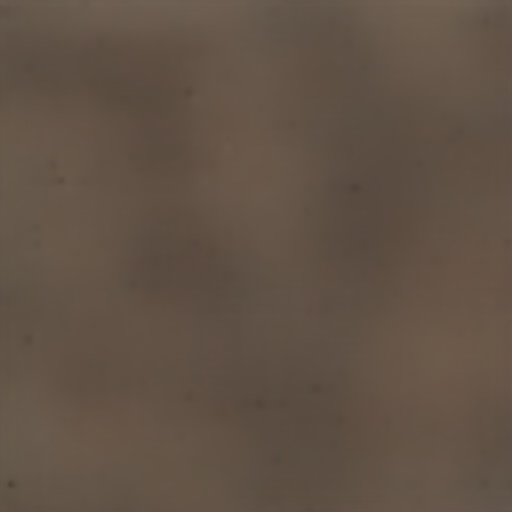

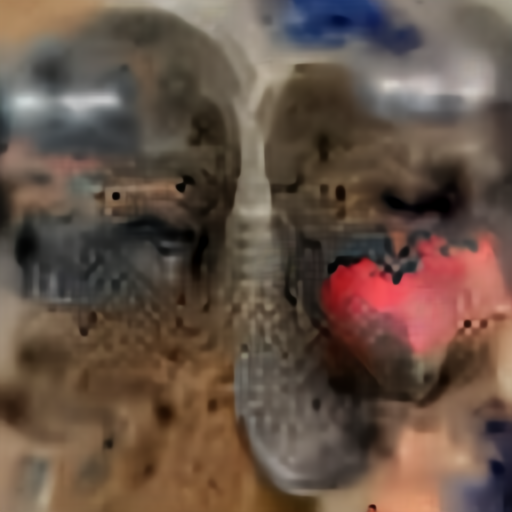

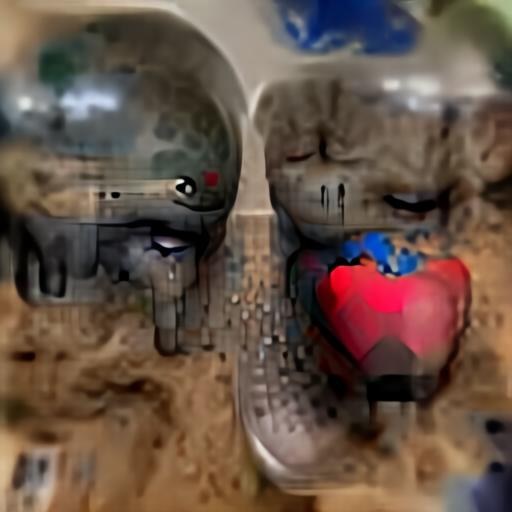

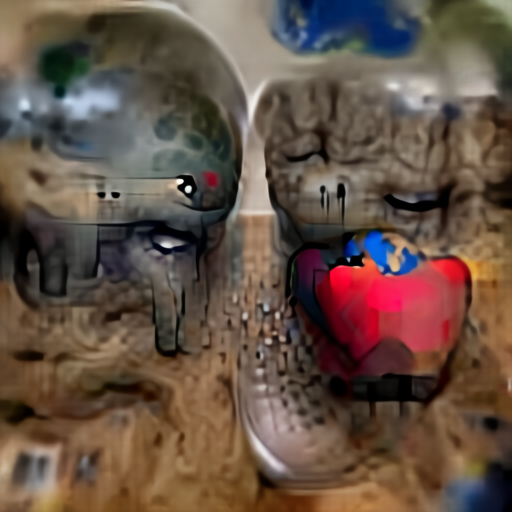

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-15-0ac8cf1e02dc>", line 17, in <module>
    train(itt)
  File "<ipython-input-15-0ac8cf1e02dc>", line 2, in train
    loss1 = ascend_txt()
  File "<ipython-input-13-27c922aefc1c>", line 33, in ascend_txt
    into = nom(into)
  File "/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py", line 727, in _call_impl
    result = self.forward(*input, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py", line 226, in forward
    return F.normalize(tensor, self.mean, self.std, self.inplace)
  File "/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py", line 276, in normalize
    mean = torch.as_tensor(mean, dtype=dtype, device=tensor.device)
KeyboardInterrupt

During handling of the above exception, anoth

KeyboardInterrupt: ignored

In [15]:
def train(i):
  loss1 = ascend_txt()
  loss = loss1[0] + loss1[1]
  loss = loss.mean()
  #Sets the gradients of all optimized torch.Tensors to zero
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()
  
  #output picture every 100 iterations
  if itt % 100 == 0:
    checkin(loss1)


itt = 0
for asatreat in range(10000):
  train(itt)
  itt+=1



I spent way longer than I was expecting typing in input text and seeing the corresponding picture. I found this by far the most fascinating thing so far this semester, perhaps because it is visually stimulating. I will include a lot of my pictures in my submission but I wont talk about all of them below since it may be repetitive and wont add too much value. I think the reason for this is because that for example, the color "pink" is a very difinitive thing and the meaning of "dog" is very clear as well. As such, there are plenty of training images of ideas like "pink" and "dog" that are all roughly the same. This is not true for things like "Life after death" or "The boundary between consciousness and unconsciousness". The names of the .PNGs submitted is the text that was used to create the images.

I made a ton of them and submitted most so feel free to look at as many or as few as you want, it isn't too important to see them all. 

While the random words/phrases such as "pink dog" or "train flag" were interesting, my favorites were the more ethereal type pictures that were often created by deep spiritual text inputs. The contrast between the heaven/hell images is particularly interesting. 

It is also interesting to note that occasionally the text that was inputted will show up in the picture. This was very apparent in "the meaning of life" and "many hands make light work". My suspicion is that this is caused by a lack of "understanding" and thus the model will be lead to "print" out the words in the picture becuase of the maximum likelihood processes being done. I am thinking that if the model can't quite figure out something, it will just print the words but this wont get penalized too much due to the words being highly correlated with the inputted text. I am further assuming that phrases like "many hands make light work" and "the meaning of life" arent as well represented in the training data as words such as "heaven", "hell", etc.

